# **Trabajo Práctico 1 - TUIA AA2 2024**  

### **Autores**:
###Avecilla Tomás Valentino (A-4239/9)
 ### Calcia Franco Nicolás (C-7363/6)
  ### Rizzotto María Camila (R-4676/1)

### **Fecha**: 14/5/2025
### **Materia**: Aprendizaje Automático 2 (AA2)  
### **Institución**: Facultad de Ciencias Exactas, Ingeniería y Agrimensura - UNR  

---  

## **Descripción del Trabajo**
Este cuaderno contiene el desarrollo del Primer Trabajo Práctico para la materia AA2. El objetivo es resolver tres problemas mediante la aplicación de distintas Redes Neuronales.  

Cada problema contará con:  
1. Análisis y tratamiento previo de los datos disponibles.  
2. Construcción del modelo de Red Neuronal.  
3. Resultados, visualizaciones y conclusiones.  

En estas etapas se hará énfasis en facilitar la comprensión de la resolución, documentando cada celda de código con comentarios relevantes y acompañando dichas celdas con explicaciones en texto si es necesario.

## Preparacion del Entorno de Trabajo

In [ ]:
%%capture
!gdown "1laUx6pPOBXNgex5mWUG7Y8_IgiAQk5-1" --output students_performance.zip
!gdown "19VxRzTrIoKsreVfCdSEy-66ZMHHqJ-dW" --output natural_scenes.zip

In [ ]:
%%capture
!unzip students_performance.zip -d students_performance
!unzip natural_scenes.zip -d natural_scenes

In [ ]:
%%capture
# pip installers

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Flatten, Dense, Input, GlobalAveragePooling2D, Dropout, Conv2D, MaxPooling2D, BatchNormalization, ReLU, Add
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
import pickle #para guardar history de los entrenamientos de los modelos
import os
import random
import shutil

In [ ]:
# Configurar para que TensorFlow utilice la GPU por defecto
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Configurar para que TensorFlow asigne memoria dinámicamente
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Especificar la GPU por defecto
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Manejar error
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [ ]:
#Vamos a hacer una función para guardar los parámetros de los modelos que entrenemos y su history
def save_model_and_history(model, history, filename='mi_modelo_entrenado'):
    """
    Guarda el modelo (.keras) y el history (.pkl) usando el mismo nombre base.

    Parámetros:
    - model: modelo Keras ya entrenado
    - history: objeto `history` obtenido de `model.fit()`
    - filename: nombre base para los archivos
    """
    # Guardar el modelo en formato nuevo
    model.save(f'{filename}.keras')

    # Guardar el history
    with open(f'{filename}_history.pkl', 'wb') as f:
        pickle.dump(history.history, f)

    print(f'Modelo guardado como {filename}.keras')
    print(f'Historial guardado como {filename}_history.pkl')

#y otra para poder cargarlos después
def load_model_and_history(filename='mi_modelo_entrenado'):
    """
    Carga el modelo (.keras) y el history (.pkl) guardados previamente.

    Retorna:
    - model: modelo Keras cargado
    - history: objeto simulado con el atributo `history`
    """
    # Cargar el modelo
    model = load_model(f'{filename}.keras')

    # Cargar el history
    with open(f'{filename}_history.pkl', 'rb') as f:
        history_dict = pickle.load(f)

    # Crear un objeto dummy para emular el atributo `history`
    class DummyHistory:
        def __init__(self, history):
            self.history = history

    history = DummyHistory(history_dict)

    print(f'Modelo cargado desde {filename}.keras')
    print(f'Historial cargado desde {filename}_history.pkl')

    return model, history

In [ ]:
#Hacemos función para graficar métricas vs loss porque vamos a necesitar hacerlo cada vez en los diferentes modelos
def plot_training(history, metric='accuracy'):
    """
    Grafica la evolución de loss y de una métrica (accuracy, mae, etc.) durante el entrenamiento.

    Parámetros:
    - history: objeto History de Keras
    - metric: string, nombre de la métrica a graficar ('accuracy', 'mae', etc.)
    """
    plt.figure(figsize=(12, 5))

    # Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Loss (train)')
    plt.plot(history.history['val_loss'], label='Loss (val)')
    plt.title('Loss - Evolución por época')
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.legend()

    # Métrica
    plt.subplot(1, 2, 2)
    if metric in history.history:
        plt.plot(history.history[metric], label=f'{metric} (train)')
        plt.plot(history.history[f'val_{metric}'], label=f'{metric} (val)')
        plt.title(f'{metric.upper()} - Evolución por época')
        plt.xlabel('Épocas')
        plt.ylabel(metric.upper())
        plt.legend()
    else:
        print(f"La métrica '{metric}' no se encontró en el history. Solo se graficó la pérdida.")

    plt.tight_layout()
    plt.show()

# **Problema 1: Prediccion del Rendimiento Academico de un Estudiante**

## Descripción del Trabajo
En este problema, se presenta un conjunto de datos que contiene información sobre el rendimiento académico de estudiantes universitarios, así como diversos factores que podrían influir en él. El objetivo es construir un modelo de regresión utilizando redes neuronales para predecir el índice de rendimiento académico de los estudiantes basado en las características proporcionadas.

## Diccionario de Datos

| Nombre de la Variable                 | Tipo       | Descripción                                                                 |
|----------------------------------------|-----------|-----------------------------------------------------------------------------|
| **Hours Studied**                      | Numérica  | Número total de horas dedicadas al estudio por cada estudiante.             |
| **Previous Scores**                    | Numérica  | Puntuaciones obtenidas por los estudiantes en exámenes previos.             |
| **Extracurricular Activities**         | Categórica (Sí/No) | Indica si el estudiante participa en actividades extracurriculares.        |
| **Sleep Hours**                        | Numérica  | Número promedio de horas de sueño por día del estudiante.                   |
| **Sample Question Papers Practiced**   | Numérica  | Número de cuestionarios de muestra que el estudiante practicó.              |
| **Performance Index** (Variable Objetivo) | Numérica (Entera) | Índice de rendimiento académico general (de 10 a 100, valores más altos indican mejor rendimiento). |


## Analisis exploratorio del conjunto de datos

### Analisis Descriptivo

In [ ]:
df_students_performance = pd.read_csv("students_performance/Student_Performance.csv")
df_students_performance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Hours Studied                     10000 non-null  int64  
 1   Previous Scores                   10000 non-null  int64  
 2   Extracurricular Activities        10000 non-null  object 
 3   Sleep Hours                       10000 non-null  int64  
 4   Sample Question Papers Practiced  10000 non-null  int64  
 5   Performance Index                 10000 non-null  float64
dtypes: float64(1), int64(4), object(1)
memory usage: 468.9+ KB


In [ ]:
df_students_performance.head()

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0


In [ ]:
# Resumen de estadísticas descriptivas
stats = df_students_performance.describe().T
stats['missing_values'] = df_students_performance.isnull().sum()
stats = stats.round(2)
stats.head(35)

,count,mean,std,min,25%,50%,75%,max,missing_values
Hours Studied,10000.0,4.99,2.59,1.0,3.0,5.0,7.0,9.0,0
Previous Scores,10000.0,69.45,17.34,40.0,54.0,69.0,85.0,99.0,0
Sleep Hours,10000.0,6.53,1.70,4.0,5.0,7.0,8.0,9.0,0
Sample Question Papers Practiced,10000.0,4.58,2.87,0.0,2.0,5.0,7.0,9.0,0
Performance Index,10000.0,55.22,19.21,10.0,40.0,55.0,71.0,100.0,0


Luego de hacer un sencillo vistazo podemos comenzar a hacer algunas observaciones.  
- Primero que nada notamos que el dataset **no tiene** valores faltantes lo cual nos facilitara mucho futuros analisis.  
- Luego podemos ver que la columna "Extracurricular Activities" es de tipo *object* lo cual sera un punto a tratar posteriormente.

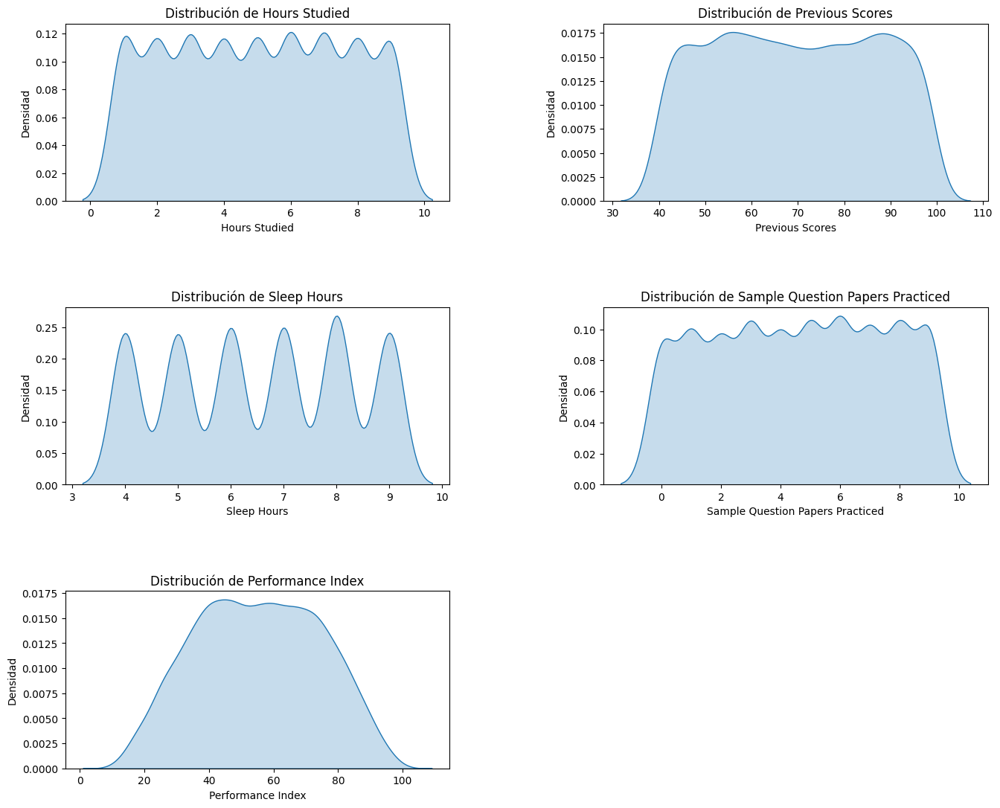

In [ ]:
df_numerico = df_students_performance.select_dtypes(include=['float64', 'int64'])

# Determinar el número de variables numéricas
num_vars = len(df_numerico.columns)
ncols = 2  # Número de columnas deseado
nrows = (num_vars // ncols) + (num_vars % ncols > 0)  # Calcula el número de filas

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 13), gridspec_kw={"hspace": .6})

# Ajustar espacio entre los gráficos
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Aplanar `axes` para evitar problemas de indexación
axes = axes.flatten()

# Recorrer las columnas y plotear cada una en su propio subplot
for i, column in enumerate(df_numerico.columns):
    sns.kdeplot(df_numerico[column], ax=axes[i], fill=True)
    axes[i].set_title(f'Distribución de {column}')
    axes[i].set_xlabel(f'{column}')
    axes[i].set_ylabel('Densidad')

# Eliminar gráficos vacíos si no se llena la última fila
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.show()


breve análisis descriptivo de los gráficos de densidad:

- **Hours Studied & Sample Question Papers Practiced**  
   - Ambas variables tienen una distribución **bastante uniforme**, lo que sugiere que los estudiantes estudian y practican cuestionarios en una variedad de cantidades sin una clara tendencia hacia ciertos valores específicos.

- **Previous Scores**  
   - Al igual que las anteriores dos, presenta una distribución **uniforme**, indicando que los estudiantes obtuvieron puntuaciones altas y bajas en exámenes previos sin ninguna tendencia en particular.

- **Sleep Hours**
   - La gráfica muestra un **patrón multimodal**, lo que podría indicar que hay grupos de estudiantes con hábitos de sueño bien diferenciados (por ejemplo, algunos duermen consistentemente 6 horas, otros 8, etc.).

- **Performance Index**  
   - Tiene una distribución **aproximadamente normal**, con una mayor concentración de valores en el centro (entre 50 y 80), lo que sugiere que la mayoría de los estudiantes tienen un rendimiento moderado, con menos casos en los extremos.


### Preprocesamiento de Datos

Primero vamos a manejar la ya notada columna de tipo *object*

In [ ]:
df_students_performance['Extracurricular Activities'] = df_students_performance['Extracurricular Activities'].map({'Yes': 1, 'No': 0})

Nos aseguramos de la inexistencia de valores nulos

In [ ]:
conteo_nan = df_students_performance.isnull().sum()
conteo_nan

,0
Hours Studied,0
Previous Scores,0
Extracurricular Activities,0
Sleep Hours,0
Sample Question Papers Practiced,0
Performance Index,0


#### Train - Test - Split

A continuación, realizaremos la división de los datos, ya que consideramos que es un paso necesario en este punto. Sin embargo, continuaremos con el análisis exploratorio y la limpieza de los datos una vez realizada esta división.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    df_students_performance.drop(columns=['Performance Index']),
    df_students_performance['Performance Index'],
    test_size=0.3,
    random_state=42
)

# Concatenar para tener dataframes completos
df_entrenamiento = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

#### Outliers

In [ ]:
def calcular_valores_atipicos(df: pd.DataFrame) -> dict:
    """
    Esta función calcula el porcentaje de valores atípicos en cada columna numérica de un DataFrame.
    Los valores atípicos se determinan usando el criterio de IQR (Rango Intercuartílico), considerando
    aquellos valores que están fuera de los límites definidos como:
    límite inferior = Q1 - 1.5 * IQR
    límite superior = Q3 + 1.5 * IQR

    Args:
    df (DataFrame): Un DataFrame de Pandas con datos numéricos.

    Returns:
    dict: Un diccionario con el porcentaje de valores atípicos por columna.
    """
    # Inicializamos un diccionario para almacenar los resultados
    resultados_atipicos = {}

    # Iteramos sobre cada columna del DataFrame
    for columna in df.columns:
        # Verificamos que la columna sea de tipo numérico
        if df[columna].dtype in ['int64', 'float64']:
            # Calculamos el primer y tercer cuartil (Q1 y Q3)
            Q1 = df[columna].quantile(0.25)
            Q3 = df[columna].quantile(0.75)

            # Calculamos el rango intercuartílico (IQR)
            IQR = Q3 - Q1

            # Definimos los límites para identificar los valores atípicos
            limite_inferior = Q1 - 1.5 * IQR
            limite_superior = Q3 + 1.5 * IQR

            # Identificamos los valores atípicos
            es_atipico = (df[columna] < limite_inferior) | (df[columna] > limite_superior)

            # Calculamos la cantidad de valores atípicos y su porcentaje
            cantidad_atipicos = es_atipico.sum()
            porcentaje_atipicos = (cantidad_atipicos / len(df)) * 100

            # Guardamos el porcentaje de atípicos en el diccionario
            resultados_atipicos[columna] = porcentaje_atipicos

    # Devolvemos el diccionario con los resultados
    return resultados_atipicos

# Llamada para imprimir los resultados
resultados = calcular_valores_atipicos(df_entrenamiento)
for columna, porcentaje in resultados.items():
    print(f"Columna: {columna} - Porcentaje de valores atípicos: {porcentaje:.2f}%")


Columna: Hours Studied - Porcentaje de valores atípicos: 0.00%
Columna: Previous Scores - Porcentaje de valores atípicos: 0.00%
Columna: Extracurricular Activities - Porcentaje de valores atípicos: 0.00%
Columna: Sleep Hours - Porcentaje de valores atípicos: 0.00%
Columna: Sample Question Papers Practiced - Porcentaje de valores atípicos: 0.00%
Columna: Performance Index - Porcentaje de valores atípicos: 0.00%


#### Matriz de Correlación

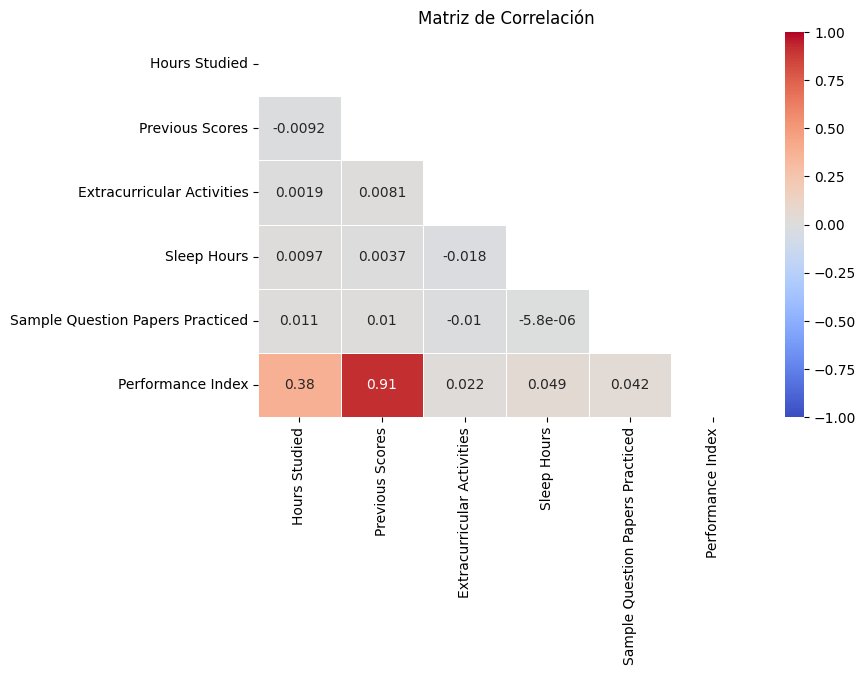

In [ ]:
# Seleccionar columnas numéricas
df_numerico = df_entrenamiento.select_dtypes(include=['float64', 'int64'])

# Calcular la matriz de correlación
corr_matrix = df_numerico.corr()

# Crear la máscara para solo mostrar la mitad superior de la matriz de correlación
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Crear el colormap (rojo-blanco)
colors = [(1, 1, 1), (1, 0, 0)]  # De blanco a rojo
n_bins = 100  # Número de bins

# Graficar el heatmap de la matriz de correlación
plt.figure(figsize=(8, 5))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1, linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()


De la matriz de correlación, notamos que sólo hay una fuerte relación lineal entre las variables 'Previous Scores' y 'Performance Index'. Por otra parte y en menor medida, la variable que describe la performance también tiene una relación (bastante débil) con las horas estudiadas. Lo que capta nuestra atención es que las horas practicadas no incidan fuertemente en el índice de performance: nuestra intuición nos dice que si los alumnos estudian practicando las Sample Question, entonces deberíamos esperar que el rendimiento académico general mejore.

## Escalamos el modelo

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Definimos el modelo

In [ ]:
model = Sequential([             # define la cantidad de features de entrada
    Dense(16, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(8, activation='relu'),
    Dense(1)  # Capa de salida para regresión
])

# Compilamos el modelo
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## Entrenamos el modelo

In [ ]:
history = model.fit(X_train_scaled, y_train, epochs=100, validation_split=0.2, verbose=1)

Epoch 1/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 3422.0752 - mae: 55.4573 - val_loss: 3170.3381 - val_mae: 53.1794
Epoch 2/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2989.0315 - mae: 51.5145 - val_loss: 1957.5995 - val_mae: 41.5093
Epoch 3/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1464.2290 - mae: 35.2801 - val_loss: 320.7186 - val_mae: 16.1320
Epoch 4/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 190.5734 - mae: 11.7927 - val_loss: 54.9286 - val_mae: 6.0103
Epoch 5/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 56.4593 - mae: 6.0544 - val_loss: 40.7918 - val_mae: 5.1281
Epoch 6/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 44.0597 - mae: 5.3351 - val_loss: 34.5627 - val_mae: 4.7110
Epoch 7/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 35.7443 - mae: 4.7977 - val_loss: 30.0313 - val_mae: 4.3867
Epoch 8/100
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 30.8742 - mae: 4.4680 - val_loss: 26.5698 - val_mae: 4.1238
Epoch 9/100
1


### Observación sobre el proceso de entrenamiento

Durante las primeras 20–30 épocas, el modelo mostró una **mejora rápida y consistente**, reduciendo considerablemente tanto el `loss` como el `mae`. A partir de la época 40 en adelante, las métricas comenzaron a **estabilizarse**, mostrando **pequeñas oscilaciones naturales** sin degradación significativa en la performance.

- La diferencia entre `train` y `val` se mantuvo **muy baja**, lo que indica **buena generalización**.
- Las últimas épocas reflejan un modelo **convergido y estable**, con `val_mae` alrededor de **1.60**, lo cual es un excelente resultado para un problema de regresión de escala amplia (recordando que inició con `mae > 50`).
- No se evidencian signos de overfitting ni underfitting.

✅ **Conclusión:** el entrenamiento fue exitoso, con una mejora sostenida y una convergencia efectiva hacia un modelo **preciso y confiable**.


## Evaluamos el modelo

In [ ]:
# Predicciones
y_pred = model.predict(X_test_scaled).flatten()
y_pred_train = model.predict(X_train_scaled).flatten()

# Métricas
mae = mean_absolute_error(y_test, y_pred)
mae_train = mean_absolute_error(y_train, y_pred_train)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))

r2 = r2_score(y_test, y_pred)
r2_train = r2_score(y_train, y_pred_train)

print(f"MAE: \nTest: {mae:.3f} Train: {mae_train:.3f}")
print(f"RMSE: \nTest:{rmse:.3f} Train: {rmse_train:.3f} ")
print(f"R²: \nTest: {r2:.3f} Train: {r2_train:.3f} ")

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
MAE: 
Test: 1.626 Train: 1.636
RMSE: 
Test:2.047 Train: 2.065 
R²: 
Test: 0.989 Train: 0.988 


| Métrica | Test | Train  | ¿Qué significa? |
|--------|-------|-------|--------|
| **MAE (Mean Absolute Error)** | 1.610 | 1.618 | En promedio, el modelo se equivoca por 1.64 puntos en el índice de rendimiento. Muy bajo. Además es similar en train y test -> sin sobreajuste. |
| **RMSE (Root Mean Squared Error)** | 2.020 | 2.045 | Similar a MAE, pero penaliza más los errores grandes. También muy bajo y similitud entre valores train/test. |
| **R² (Coeficiente de determinación)** | 0.989 | 0.989 | El 99% de la variación en los datos es explicada por el modelo. Excelente ajuste |

## Gráficos

### Evolución del loss (MSE) y MAE durante las épocas

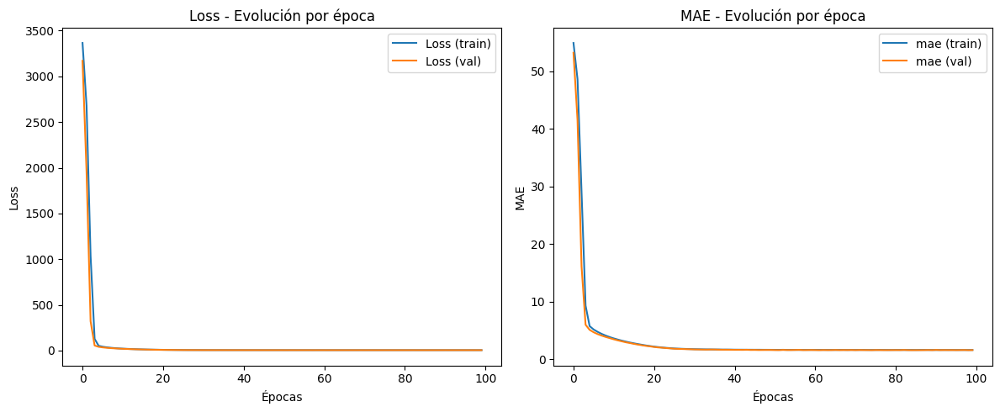

In [ ]:
plot_training(history, 'mae')



#### Gráfico de Entrenamiento del Modelo

El gráfico muestra cómo evolucionan el **MSE** y el **MAE** durante el entrenamiento y validación.

##### Loss (MSE)
- Ambas curvas (entrenamiento y validación) **bajan rápido** y se estabilizan.
- No hay separación entre ellas → **sin overfitting**.
- El modelo aprende de forma eficiente desde las primeras épocas.

##### MAE (Error Absoluto Medio)
- También disminuye rápidamente.
- Las curvas se mantienen **cercanas y estables**, lo que indica un aprendizaje **consistente**.

✅ **Conclusión:**  
El modelo **converge bien**, no presenta sobreajuste y muestra métricas bajas.



### Predicción vs Valores Reales

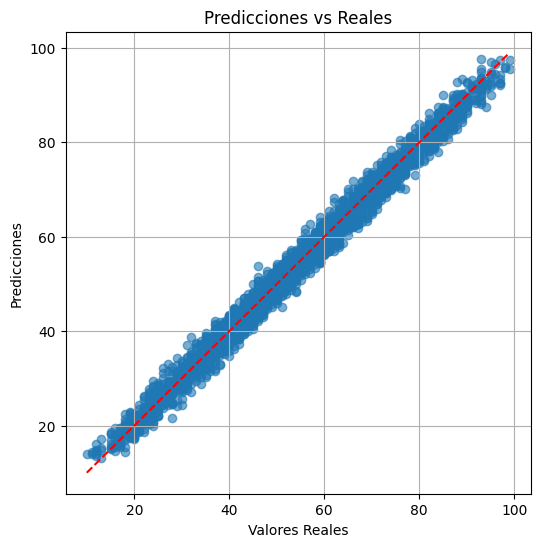

In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Valores Reales")
plt.ylabel("Predicciones")
plt.title("Predicciones vs Reales")
plt.grid(True)
plt.show()


#### Gráfico: Predicciones vs Valores Reales

Este gráfico muestra cómo de cerca están las **predicciones del modelo** respecto a los **valores reales** del rendimiento académico.

- **Eje X:** Valores reales  
- **Eje Y:** Predicciones del modelo  
- **Línea roja diagonal:** Representa la predicción perfecta

Los puntos se alinean muy bien con la línea roja → indica **alta precisión** y **bajo error**.  
No hay agrupaciones extrañas ni dispersión → el modelo no tiene sesgo ni alta varianza.

✅ **Conclusión:** logramos un modelo que tiene **muy buena capacidad predictiva** (R² ≈ 0.99) y sin señales de overfitting.


### Histograma de errores

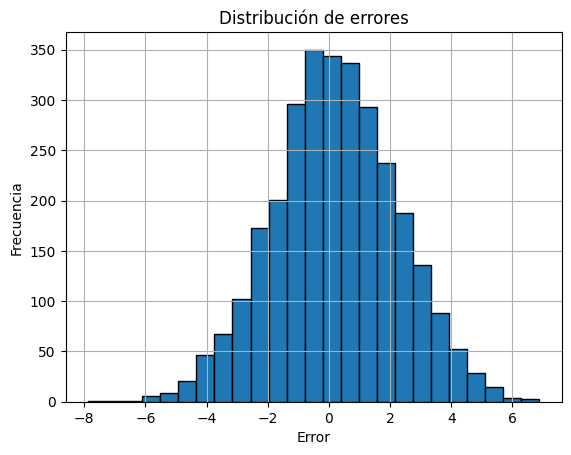

In [ ]:
errors = y_test - y_pred
plt.hist(errors, bins=25, edgecolor='black')
plt.title("Distribución de errores")
plt.xlabel("Error")
plt.ylabel("Frecuencia")
plt.grid(True)
plt.show()


Este gráfico representa la distribución de los errores cometidos por el modelo de regresión, calculados como la diferencia entre los valores reales y las predicciones.

La forma de campana simétrica centrada en cero indica que:

- El modelo **no presenta sesgos sistemáticos**, es decir, no tiende a sobrestimar ni subestimar el rendimiento académico de los estudiantes.
- La mayoría de los errores están en un rango cercano a cero, lo que refleja una **alta precisión predictiva**.
- La distribución tiene características cercanas a una **distribución normal**, lo cual es deseable en modelos de regresión bien ajustados y permite aplicar análisis estadísticos posteriores con mayor validez.

Este gráfico complementa la evaluación global del modelo y confirma que los errores están bien distribuidos, sin presencia significativa de outliers o patrones anómalos.



# **Problema 3: Clasificación de Escenas Naturales con Redes Convolucionales**

##  Descripción del Trabajo  
En este problema se aborda la tarea de clasificación de imágenes de escenas naturales capturadas alrededor del mundo. El conjunto de datos proporcionado incluye imágenes de distintas categorías de paisajes, y el objetivo principal es construir y comparar el rendimiento de distintos modelos de redes neuronales, incluyendo redes densas, convolucionales, bloques residuales e incluso transfer learning.


---

##  Dataset

El conjunto de datos consta de aproximadamente **25,000 imágenes** de tamaño **150x150 píxeles**, organizadas en las siguientes carpetas:

- `train/`: ~14,000 imágenes para entrenamiento.
- `test/`: ~3,000 imágenes para evaluación.
- `prediction/`: ~7,000 imágenes para predicciones finales del modelo entrenado.

### Categorías (etiquetas):
1. **buildings** – Edificaciones urbanas o arquitectónicas  
2. **forest** – Paisajes boscosos  
3. **glacier** – Escenarios con formaciones glaciares o hielo  
4. **mountain** – Montañas y cordilleras  
5. **sea** – Océanos, mares y ambientes acuáticos  
6. **street** – Calles urbanas


### Configuración inicial y carga de datos

In [ ]:
def crear_generadores(img_size=(150, 150), batch_size=32):
    """
    Crea generadores de imágenes para entrenamiento, validación y predicción
    con el tamaño de imagen y batch definidos por el usuario.

    Parámetros:
    - img_size: tupla (ancho, alto) de la resolución a usar.
    - batch_size: cantidad de imágenes por lote.

    Retorna:
    - train_gen: generador de entrenamiento con etiquetas.
    - val_gen: generador de validación con etiquetas.
    - pred_gen: generador para predicciones sin etiquetas.
    """
    datagen = ImageDataGenerator(rescale=1./255)

    # Generador para entrenamiento
    train_gen = datagen.flow_from_directory(
        'natural_scenes/seg_train/seg_train',
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Generador para validación/test
    val_gen = datagen.flow_from_directory(
        'natural_scenes/seg_test/seg_test',
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Generador para predicciones
    pred_gen = datagen.flow_from_directory(
        'natural_scenes/seg_pred',
        target_size=img_size,
        batch_size=batch_size,
        class_mode=None, #no hay etiquetas
        shuffle=False  #mantener el orden de los archivos
    )

    return train_gen, val_gen, pred_gen

def crear_generadores_evaluacion_acc(img_size=(150, 150), batch_size=32):
    """
    Crea generadores de imágenes para entrenamiento, validación con shuffles = False para evaluación
    final de la métrica accuracy en train y test(val)

    Parámetros:
    - img_size: tupla (ancho, alto) de la resolución a usar.
    - batch_size: cantidad de imágenes por lote.

    Retorna:
    - train_gen: generador de entrenamiento con etiquetas.
    - val_gen: generador de validación con etiquetas.
    """
    datagen = ImageDataGenerator(rescale=1./255)

    # Generador para entrenamiento
    train_gen = datagen.flow_from_directory(
        'natural_scenes/seg_train/seg_train',
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Generador para validación/test
    val_gen = datagen.flow_from_directory(
        'natural_scenes/seg_test/seg_test',
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    return train_gen, val_gen


- Escalamos los valores de las imágenes entre 0 y 1.
- Cargamos las imágenes desde las carpetas correctas.
- Codificamos las etiquetas.
- Preparamos generadores para entrenamiento, validación y predicción.


In [ ]:
#Vemos algunas imágenes del generador de train para comprobar la lectura de las imágenes y sus labels
train_gen, val_gen, pred_gen = crear_generadores() #dejamos tamaño original

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 7301 images belonging to 1 classes.


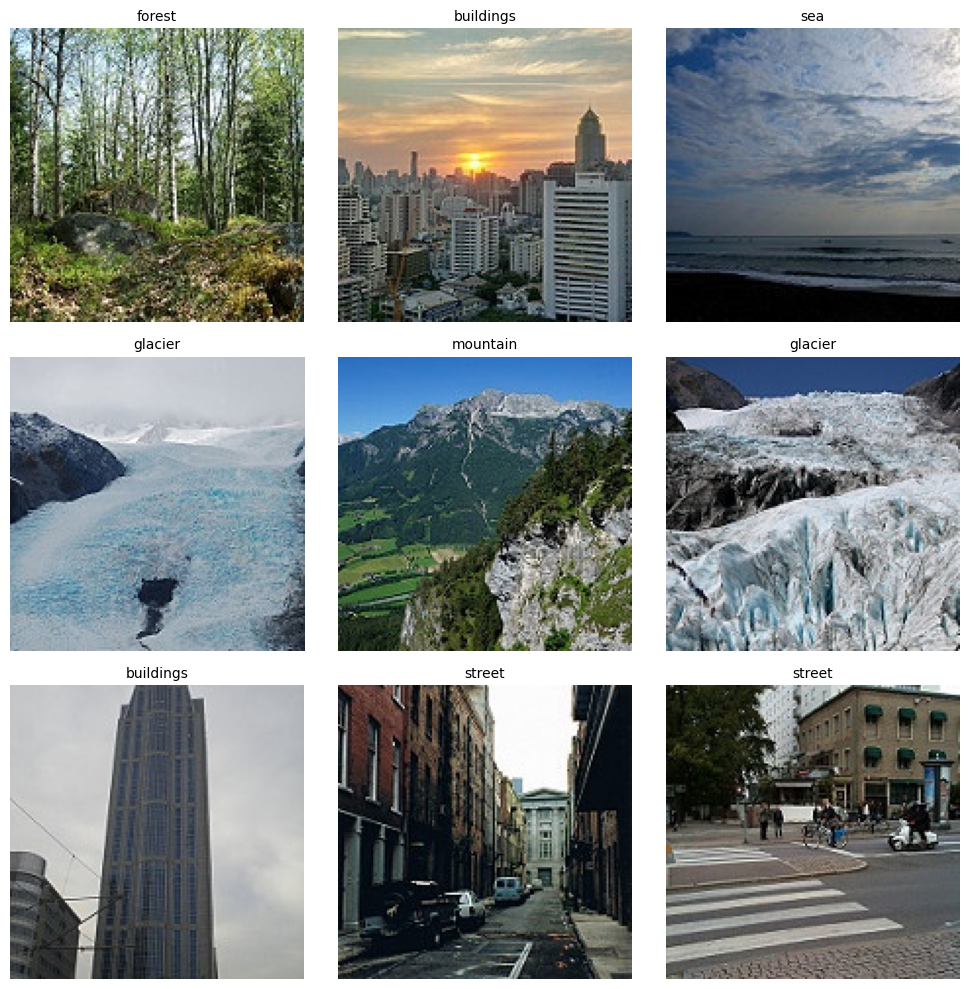

In [ ]:
#Tomamos un batch
images, labels = next(train_gen)

#Definimos imágenes a mostrar
n = 9

#Ggrid de subplots
plt.figure(figsize=(10,10))
class_names = list(train_gen.class_indices.keys())

for i in range(n):
    plt.subplot(3, 3, i + 1)  # 3 filas, 3 columnas
    plt.imshow(images[i])
    plt.title(class_names[np.argmax(labels[i])], fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

### Balance de las clases
Vamos a ver si las clases están balanceadas, para decidir qué métricas son adecuadas para evaluar los modelos de clasificación que generamos en este problema

In [ ]:
# Obtenemos las clases
labels = train_gen.classes

# Obtenemos el nombre de c/u
class_names = list(train_gen.class_indices.keys())

# Conteo de imágenes
counts = np.bincount(labels)

# Mostramos en una tabla
df_counts = pd.DataFrame({
    'Clase': class_names,
    'Cantidad de imágenes': counts,
    'Porcentaje sobre el dataset': (counts / len(labels) * 100).round(1)
})

print(df_counts)

       Clase  Cantidad de imágenes  Porcentaje sobre el dataset
0  buildings                  2191                         15.6
1     forest                  2271                         16.2
2    glacier                  2404                         17.1
3   mountain                  2512                         17.9
4        sea                  2274                         16.2
5     street                  2382                         17.0


Se nota que todas las clases tienen entre unas 2200 y 2500 imágenes, que representan entre un 15,5 y 18% del dataset. La mayor diferencia ocurre entre 'buildings' y 'mountain', con una diferencia de unas 300 fotos, lo que en el contexto de las 2200/2500 en que oscilan las clases es una diferencia baja. Por esto consideramos al dataset como balanceado, y vamos a fijarnos en la métrica 'accuracy' para comparar los modelos

## **Modelo 1: Red Neuronal con Capas Densas (baseline)**


### Definición del modelo con capas densas

In [ ]:
#Pare este modelo vamos a variar la complejidad del mismo achicando las imágenes a 64*64, ya con el tamaño original de 150*150
#nos quedarían muchos parámetros al realizar flatten():
train_gen, val_gen, pred_gen = crear_generadores(img_size=(64, 64))

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 7301 images belonging to 1 classes.


In [ ]:
nn_model = Sequential([
    Input(shape=(64, 64, 3)),
    Flatten(),  # Aplana a vector 64x64x3 = 12,288
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(6, activation='softmax')  # Salida para 6 clases
])

# Compilación
nn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Resumen del modelo
nn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 12288)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,572,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,581,638 (6.03 MB)

 Trainable params: 1,581,638 (6.03 MB)

 Non-trainable params: 0 (0.00 B)

Este modelo:

- Definimos la red con dos capas ocultas densas.

- La capa de salida tiene 6 neuronas (una por clase), con activación softmax.

- Compilamos con categorical_crossentropy porque usamos class_mode='categorical' en los generadores.

### Entrenamiento del modelo

Utilizamos EarlyStopping para monitorear una métrica y cortar el entrenamiento si no hay mejora después de cierta cantidad de épocas (patience).
Este bloque lo vamos a utilizar para este modelo y los que siguen.

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=10,
    mode='max',
    restore_best_weights=True,
    verbose=1
)

In [ ]:
EPOCHS = 30

nn_capas_densas_history = nn_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping]
)

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


439/439 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.3857 - loss: 1.6506 - val_accuracy: 0.4563 - val_loss: 1.4129
Epoch 2/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.4883 - loss: 1.3214 - val_accuracy: 0.5060 - val_loss: 1.2958
Epoch 3/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.5387 - loss: 1.2036 - val_accuracy: 0.5450 - val_loss: 1.2019
Epoch 4/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.5562 - loss: 1.1635 - val_accuracy: 0.5320 - val_loss: 1.2421
Epoch 5/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - accuracy: 0.5777 - loss: 1.1053 - val_accuracy: 0.5073 - val_loss: 1.2700
Epoch 6/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step - accuracy: 0.5828 - loss: 1.0861 - val_accuracy: 0.5360 - val_loss: 1.2123
Epoch 7/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.5979 - loss: 1.0465 - val_accuracy: 0.5530 - val_loss: 1.2079
Epoch 8/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - accuracy: 0.6064 - loss: 1.0380 - val_accurac

In [ ]:
save_model_and_history(nn_model, nn_capas_densas_history, 'modelo_capas_densas')

Modelo guardado como modelo_capas_densas.keras
Historial guardado como modelo_capas_densas_history.pkl


- Entrena el modelo durante 30 épocas.

- Utiliza los generadores que cargan imágenes desde disco.

- Guardamos el modelo y el historial de entrenamiento para poder retomarlo en cualquier sesión de colab

### Evaluacion del modelo

#### Visualización del entrenamiento (accuracy y loss)

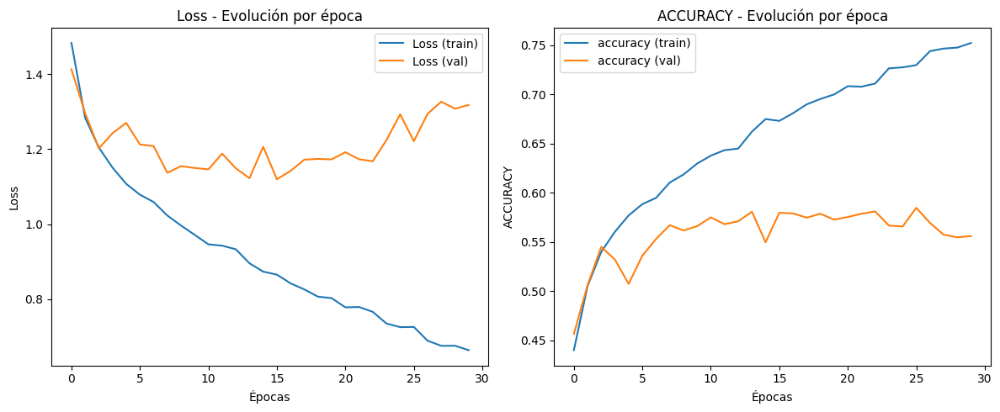

In [ ]:
plot_training(nn_capas_densas_history, 'accuracy')

Hay un claro **overfitting**: en los datos de entrenamiento el modelo tiene buen accuracy que mejora con cada época y disminuye el loss con cada una también, pero los datos de validación vemos que se aplanan y no mejoran más después de las primeras épocas: llegaron en ambas gráficas a estancarse con valores de loss muy alto y fluctuante al rededor de 1.2, y en accuracy también se mantiene fluctuante al rededor de 0.55. Los datos están siendo memorizados

#### Evaluación final de métrica

In [ ]:
#Evaluar con nuevos generadores (shuffle=False)
train_gen_eval, val_gen_eval = crear_generadores_evaluacion_acc(img_size=(64, 64))

nn_train_loss, nn_train_acc = nn_model.evaluate(train_gen_eval, verbose=0)
nn_val_loss, nn_val_acc = nn_model.evaluate(val_gen_eval, verbose=0)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
round(nn_train_acc,3), round(nn_val_acc,3)

(0.77, 0.585)

#### Predicciones de ejemplo visualizadas

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


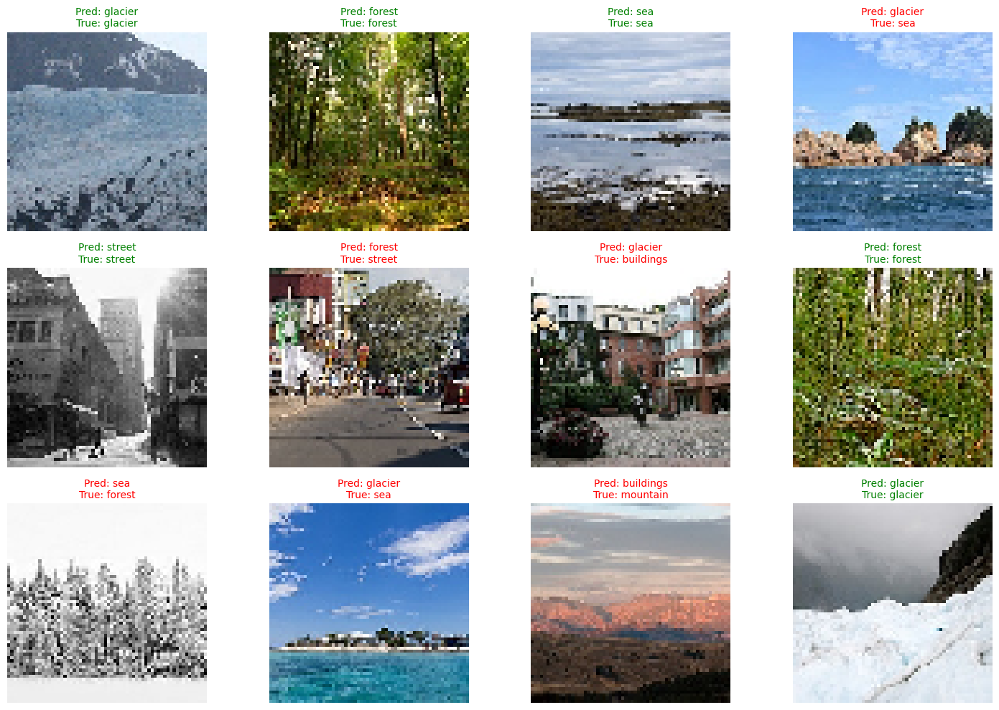

In [ ]:
# Visualización de predicciones acertadas y fallidas
# Obtener los nombres de las clases
class_names = list(val_gen.class_indices.keys())

# Preparar datos reales del generador de validación
X_val, y_val = [], []
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_val.append(x_batch)
    y_val.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

X_val = np.concatenate(X_val)
y_val = np.argmax(np.concatenate(y_val), axis=1)

# Obtener predicciones
y_pred_probs = nn_model.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)

# Función para visualizar
def plot_predictions(X, y_true, y_pred, class_names, num_images=12):
    plt.figure(figsize=(15, 10))
    indices = np.random.choice(len(X), size=num_images, replace=False)

    for i, idx in enumerate(indices):
        plt.subplot(3, 4, i+1)
        plt.imshow(X[idx])
        plt.axis('off')

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        correct = y_true[idx] == y_pred[idx]

        color = 'green' if correct else 'red'
        plt.title(f'Pred: {pred_label}\nTrue: {true_label}', color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones
plot_predictions(X_val, y_val, y_pred, class_names, num_images=12)

La mitad de esta pequeña muestra tiene una predicción incorrecta.

#### **Conclusión Parcial**
La performance de este modelo no es muy buena (accuracy en test ~58%), y hay presencia de overfitting. Es mejor que una clasificación al azar, ya que con 6 clases, el azar daría un 16.6% de accuracy. Es decir, sí hay aprendizaje en este modelo, pero limitado. Esto es esperado: es mucha la información que queda sin procesar espacialmente debido al flatten() inicial, y entonces imaginábamos que esta arquitectura no iba a capturar bien patrones como bordes, texturas, formas, obteniendo un accuracy final bajo y overfitting por no entender las "formas" generales de las imágenes. Por lo tanto las redes densas sin capas convolucionales no parecen eficientes para este problema. Esperamos mejores resultados en el siguiente modelo

## **Modelo 2: CNN simple (capas convolucionales y densas)**

### Definición del modelo CNN

In [ ]:
# Modelo CNN
cnn_model = Sequential([
    Input(shape=(150, 150, 3)),

    # Primer bloque conv
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Segundo bloque conv
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Tercer bloque conv
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(6, activation='softmax')
])

cnn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_38 (Conv2D)              │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_39 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_40 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 128)            │     5,308,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,402,566 (20.61 MB)

 Trainable params: 5,402,566 (20.61 MB)

 Non-trainable params: 0 (0.00 B)

- Extrae características espaciales de las imágenes.

- Termina con capas densas para la clasificación.

- Incluye Dropout para mejorar la generalización.

### Entrenamiento del modelo CNN

In [ ]:
train_gen, val_gen, pred_gen = crear_generadores() #en este modelo vamos a usar las imágenes con su tamaño original

# Entrenamiento del modelo CNN
EPOCHS = 30

history_cnn = cnn_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping]
)

Epoch 1/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.5025 - loss: 1.2563 - val_accuracy: 0.7580 - val_loss: 0.6777
Epoch 2/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.7385 - loss: 0.7068 - val_accuracy: 0.7970 - val_loss: 0.5593
Epoch 3/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step - accuracy: 0.8065 - loss: 0.5358 - val_accuracy: 0.8030 - val_loss: 0.5757
Epoch 4/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step - accuracy: 0.8360 - loss: 0.4504 - val_accuracy: 0.8103 - val_loss: 0.5326
Epoch 5/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.8811 - loss: 0.3295 - val_accuracy: 0.8253 - val_loss: 0.5122
Epoch 6/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step - accuracy: 0.9077 - loss: 0.2486 - val_accuracy: 0.8053 - val_loss: 0.6385
Epoch 7/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.9352 - loss: 0.1907 - val_accuracy: 0.8150 - val_loss: 0.6927
Epoch 8/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.9487 - loss: 0.1448 - 

### Evaluación del Modelo

#### Visualización del rendimiento (Accuracy y Loss)

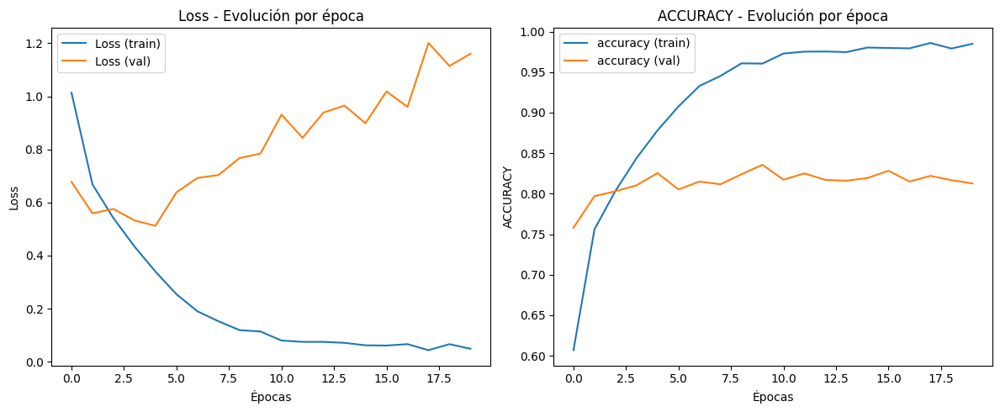

In [ ]:
plot_training(history_cnn, 'accuracy')

Overfitting claro. Vamos a reentrenar el modelo más abajo explicando los cambios

### Reentrenamiento del modelo

Se va tratar de mejorar el modelo usando las técnicas de esta arquitectura destinadas a evitar el overfitting. Hacemos los siguientes cambios:
- **Data Augmentation:** genera imágenes variadas a partir del set original.
- **BatchNormalization:** estabiliza y acelera el entrenamiento.
- **EarlyStopping:** detiene el entrenamiento si no hay mejora en `val_loss`.
- **ReduceLROnPlateau:** baja el learning rate automáticamente si se estanca.



In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    mode='min',
    restore_best_weights=True,
    verbose=1
)

In [ ]:
#Data Augmentation (entrenamiento) + normalización (validación)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    'natural_scenes/seg_train/seg_train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

val_gen = val_datagen.flow_from_directory(
    'natural_scenes/seg_test/seg_test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

#Modelo CNN mejorado
cnn_model_improved = Sequential([
    Input(shape=(150, 150, 3)),

    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.4),
    Dense(6, activation='softmax')  # 6 clases
])

cnn_model_improved.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

cnn_model_improved.summary()

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     5,308,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,403,462 (20.61 MB)

 Trainable params: 5,403,014 (20.61 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=7,
    verbose=1,
    mode='min',
    min_lr=1e-6
)

In [ ]:
EPOCHS = 30

history_cnn_improved = cnn_model_improved.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping, reduce_lr]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 106s 217ms/step - accuracy: 0.3880 - loss: 2.8281 - val_accuracy: 0.3887 - val_loss: 1.4701 - learning_rate: 0.0010
Epoch 2/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 86s 197ms/step - accuracy: 0.4892 - loss: 1.2958 - val_accuracy: 0.6413 - val_loss: 0.9379 - learning_rate: 0.0010
Epoch 3/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 88s 199ms/step - accuracy: 0.5383 - loss: 1.1867 - val_accuracy: 0.6230 - val_loss: 1.0428 - learning_rate: 0.0010
Epoch 4/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 87s 197ms/step - accuracy: 0.5539 - loss: 1.1371 - val_accuracy: 0.7493 - val_loss: 0.7905 - learning_rate: 0.0010
Epoch 5/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 86s 196ms/step - accuracy: 0.5795 - loss: 1.0749 - val_accuracy: 0.6840 - val_loss: 1.0806 - learning_rate: 0.0010
Epoch 6/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 88s 200ms/step - accuracy: 0.6047 - loss: 1.0101 - val_accuracy: 0.5437 - val_loss: 1.3841 - learning_rate: 0.0010
Epoch 7/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 87s 197ms/step - accuracy: 0.

In [ ]:
save_model_and_history(cnn_model_improved, history_cnn_improved, 'cnn_model_improved')

Modelo guardado como cnn_model_improved.keras
Historial guardado como cnn_model_improved_history.pkl


In [ ]:
cnn_model_improved, history_cnn_improved = load_model_and_history('cnn_model_improved')

Modelo cargado desde cnn_model_improved.keras
Historial cargado desde cnn_model_improved_history.pkl


###Evaluación del Modelo Mejorado

####Plot Accuracy y Loss

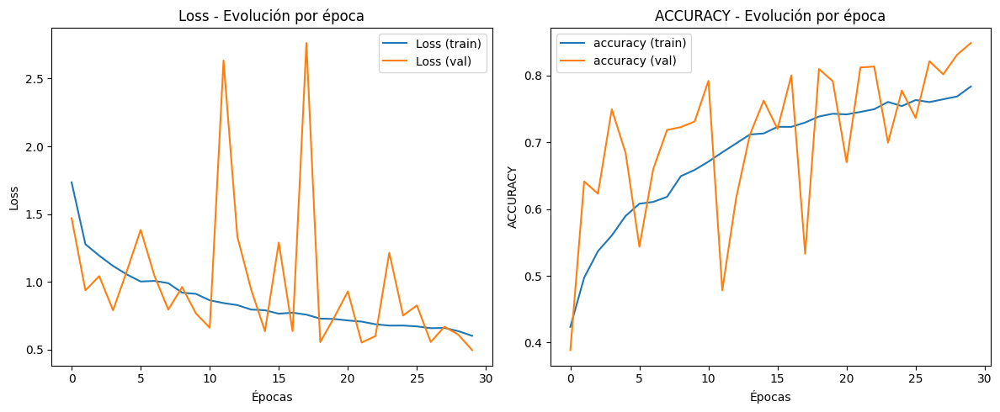

In [ ]:
plot_training(history_cnn_improved, 'accuracy')

Ahora, si bien hay mucha inestabilidad en la curva de validación, ella va en conjunto con la curva de train, por lo que el modelo aprende y es capaz de generalizar. Hay dos picos feos en las épocas 12 y 18, pero el modelo fue capaz de volver de eso y se ve que para las épocas finales se vuelca a cierta estabilización. Las fluctuaciones de las curvas de validación pueden deberse a que el dataset de val tiene 3000 imágenes solamente contra el de train que tiene 14000.

####Evaluación métricas finales

In [ ]:
train_gen_eval, val_gen_eval = crear_generadores_evaluacion_acc()

cnn_train_loss, cnn_train_acc = cnn_model_improved.evaluate(train_gen_eval, verbose=0)
cnn_val_loss, cnn_val_acc = cnn_model_improved.evaluate(val_gen_eval, verbose=0)

round(cnn_train_acc,3), round(cnn_val_acc,3)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


(0.856, 0.849)

Logramos alta precisión sin overfitting significativo

####Matriz de Confusión

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


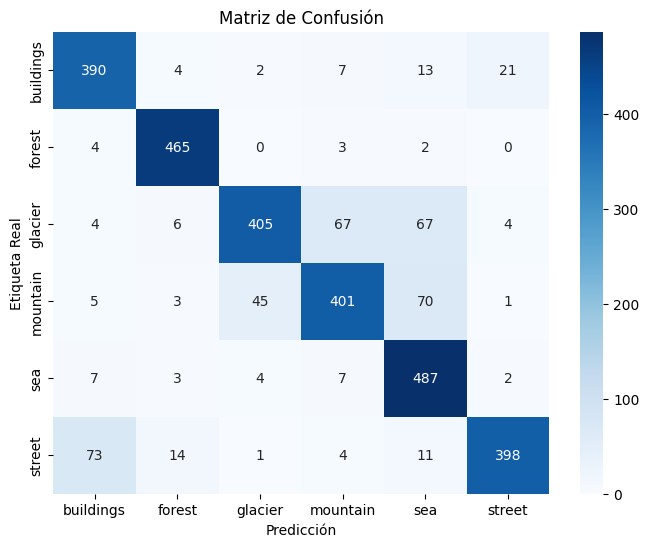

In [ ]:
# Obtener las verdaderas etiquetas y predicciones
X_test, y_test = [], []

# Recorremos val_gen para obtener todos los datos reales
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_test.append(x_batch)
    y_test.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

# Convertimos a arrays
X_test = np.concatenate(X_test)
y_test = np.argmax(np.concatenate(y_test), axis=1)

# Predicciones del modelo
y_pred_probs = cnn_model_improved.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=val_gen.class_indices.keys(), yticklabels=val_gen.class_indices.keys())
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta Real")
plt.show()

El modelo confunde mucho glaciares con montañas y mares, montañas con mares y calles con edificios

#### Visualizar ejemplos aleatorios

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


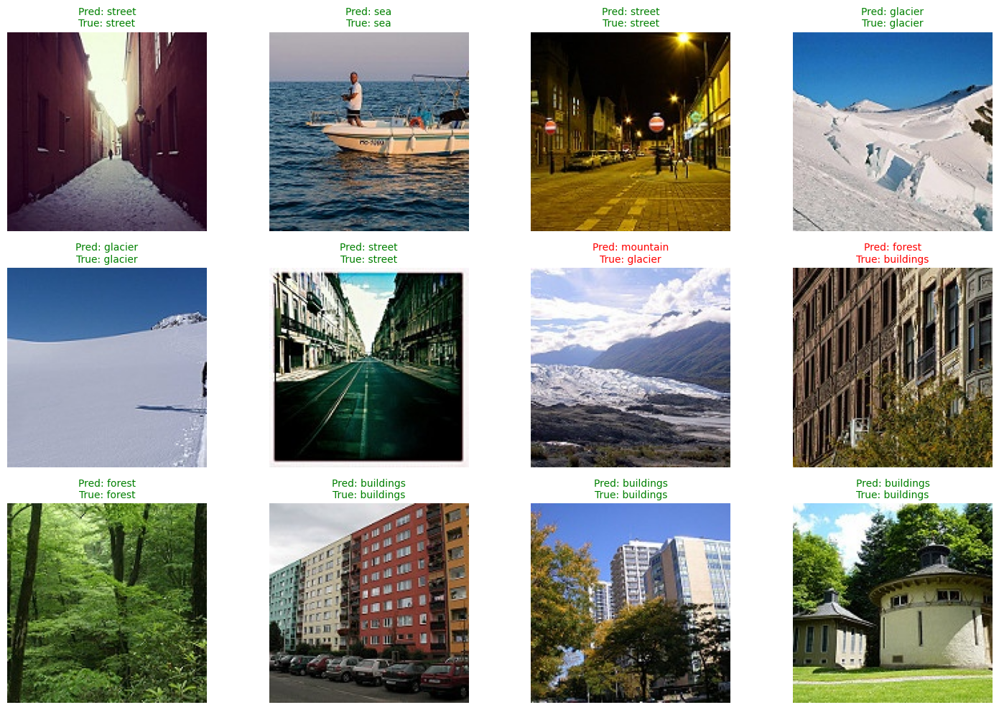

In [ ]:
# Visualización de predicciones acertadas y fallidas
# Obtener los nombres de las clases
class_names = list(val_gen_eval.class_indices.keys())

# Preparar datos reales del generador de validación
X_val, y_val = [], []
for i in range(len(val_gen_eval)):
    x_batch, y_batch = val_gen_eval[i]
    X_val.append(x_batch)
    y_val.append(y_batch)
    if (i + 1) * val_gen_eval.batch_size >= val_gen_eval.samples:
        break

X_val = np.concatenate(X_val)
y_val = np.argmax(np.concatenate(y_val), axis=1)

# Obtener predicciones
y_pred_probs = cnn_model_improved.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)

# Función para visualizar
def plot_predictions(X, y_true, y_pred, class_names, num_images=12):
    plt.figure(figsize=(15, 10))
    indices = np.random.choice(len(X), size=num_images, replace=False)

    for i, idx in enumerate(indices):
        plt.subplot(3, 4, i+1)
        plt.imshow(X[idx])
        plt.axis('off')

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        correct = y_true[idx] == y_pred[idx]

        color = 'green' if correct else 'red'
        plt.title(f'Pred: {pred_label}\nTrue: {true_label}', color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones
plot_predictions(X_val, y_val, y_pred, class_names, num_images=12)

#### **Conclusión Parcial**
La performance de este modelo mejoró mucho con respecto al anterior. Se nota que agregar capas convolucionales es lo correcto para resolver este tipo de problema. Sin embargo, hay inestabilidad en la evaluación. Notamos que el early_stopping funcionaría mejor si las métricas de validación cambiaran menos, y quizás no hubiese entrenado la totalidad de las épocas. Podría mejorar con un data augmentation más agresivo, pero pensamos que se debe en gran parte a que el set de validación es chico, y si es así, en los próximos modelos seguiríamos viendo estas fluctuaciones. Vamos a ver cómo nos dan su desempeño.

## **Modelo 3: Red convolucional con bloques residuales de identidad**

### Función para crear bloques residuales identidad

In [ ]:
def residual_identity_block(x, filters):
    shortcut = x
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    # No activación aquí, primero sumamos
    x = Add()([x, shortcut])
    x = ReLU()(x)
    return x

### Modelo CNN con bloques residuales (ResNet-like)

In [ ]:
train_gen, val_gen, pred_gen = crear_generadores() #usamos tamaños originales

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 7301 images belonging to 1 classes.


In [ ]:
# Entrada
inputs = Input(shape=(150, 150, 3))

# Bloques iniciales
x = Conv2D(32, (5, 5), padding='same')(inputs)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)


# Bloque residual 1
x = residual_identity_block(x, 32)

# Aumentamos filtros y reducimos dimensiones
x = Conv2D(64, (3, 3), strides=2, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)


# Bloque residual 2
x = residual_identity_block(x, 64)

# Otra subida de filtros
x = Conv2D(128, (3, 3), strides=2, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Cierre
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(6, activation='softmax')(x)

# Crear modelo
resnet_model = Model(inputs=inputs, outputs=outputs)

# Compilar
resnet_model.compile(optimizer=Adam(learning_rate=0.0005),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

resnet_model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 150, 150,  │      2,432 │ input_layer_10[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 150,  │        128 │ conv2d_31[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_28 (ReLU)     │ (None, 150, 150,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 75, 75,    │          0 │ re_lu_28[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_32 (Conv2D)  │ (None, 75, 75,    │      9,248 │ max_pooling2d_11… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        128 │ conv2d_32[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_29 (ReLU)     │ (None, 75, 75,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_33 (Conv2D)  │ (None, 75, 75,    │      9,248 │ re_lu_29[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        128 │ conv2d_33[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 75, 75,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │ max_pooling2d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_30 (ReLU)     │ (None, 75, 75,    │          0 │ add_8[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_34 (Conv2D)  │ (None, 38, 38,    │     18,496 │ re_lu_30[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 38, 38,    │        256 │ conv2d_34[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_31 (ReLU)     │ (None, 38, 38,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_35 (Conv2D)  │ (None, 38, 38,    │     36,928 │ re_lu_31[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 38, 38,    │        256 │ conv2d_35[0][0] 

 Total params: 2,844,806 (10.85 MB)

 Trainable params: 2,843,974 (10.85 MB)

 Non-trainable params: 832 (3.25 KB)

- Hay 2 bloques residuales con suma de entrada (input + output).

- Se usan BatchNormalization y ReLU como en ResNet original.

- Dropout para evitar overfitting

- Termina con Dense(6, softmax) para clasificar las 6 escenas

### Entrenamiento del modelo

In [ ]:
# Entrenamiento del modelo ResNet-like
EPOCHS = 30

history_resnet = resnet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping]
)

Epoch 1/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.4617 - loss: 2.0310 - val_accuracy: 0.3213 - val_loss: 2.9176
Epoch 2/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 51ms/step - accuracy: 0.6316 - loss: 0.9502 - val_accuracy: 0.6640 - val_loss: 0.8423
Epoch 3/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7061 - loss: 0.7846 - val_accuracy: 0.1813 - val_loss: 9.7967
Epoch 4/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step - accuracy: 0.7369 - loss: 0.7073 - val_accuracy: 0.4293 - val_loss: 1.7504
Epoch 5/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.7726 - loss: 0.6203 - val_accuracy: 0.8063 - val_loss: 0.5390
Epoch 6/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step - accuracy: 0.7896 - loss: 0.5783 - val_accuracy: 0.8113 - val_loss: 0.5186
Epoch 7/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.8037 - loss: 0.5448 - val_accuracy: 0.7697 - val_loss: 0.6314
Epoch 8/30
439/439 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.8115 - loss: 0.5277 - 

In [ ]:
save_model_and_history(resnet_model, history_resnet, 'resnet_model')

Modelo guardado como resnet_model.keras
Historial guardado como resnet_model_history.pkl


In [ ]:
resnet_model, history_resnet = load_model_and_history('resnet_model')

Modelo cargado desde resnet_model.keras
Historial cargado desde resnet_model_history.pkl


### Evaluación del modelo

#### Visualización de accuracy y loss

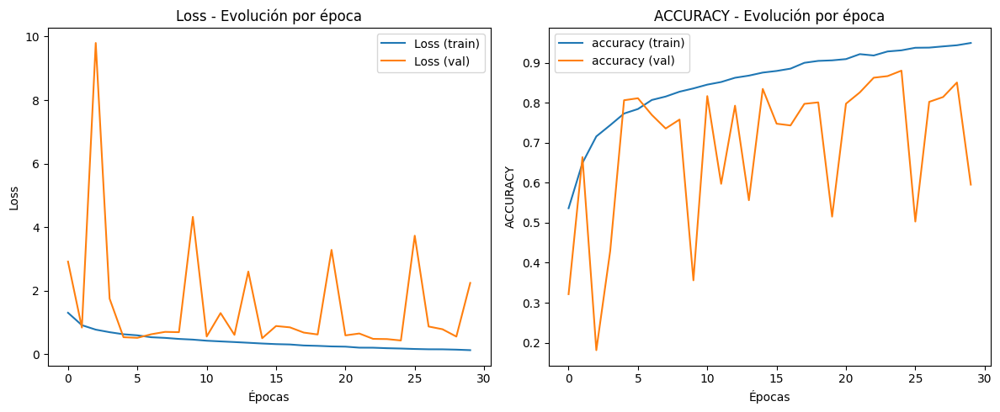

In [ ]:
plot_training(history_resnet, 'accuracy')

Sigue habiendo inestabilidad en la curva de validation, pero el modelo no es malo, este también está aprendiendo y generalizando bastante bien. Con estas fluctuaciones recurrentes seguimos confirmando que es porque el set de validación es relativamente chico.

#### Evaluación métricas

In [ ]:
train_gen_eval, val_gen_eval = crear_generadores_evaluacion_acc()

resnet_train_loss, resnet_train_acc = resnet_model.evaluate(train_gen_eval, verbose=0)
resnet_val_loss, resnet_val_acc = resnet_model.evaluate(val_gen_eval, verbose=0)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


(0.9736354351043701, 0.8803333044052124)

In [ ]:
round(resnet_train_acc,3), round(resnet_val_acc,3)

(0.974, 0.88)

Es hasta ahora el que mejores métricas nos ha dado, superando al modelo de CNN, aunque presentan más diferencia entre train y validación (overfit)

####**Matriz de confusión**

94/94 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step


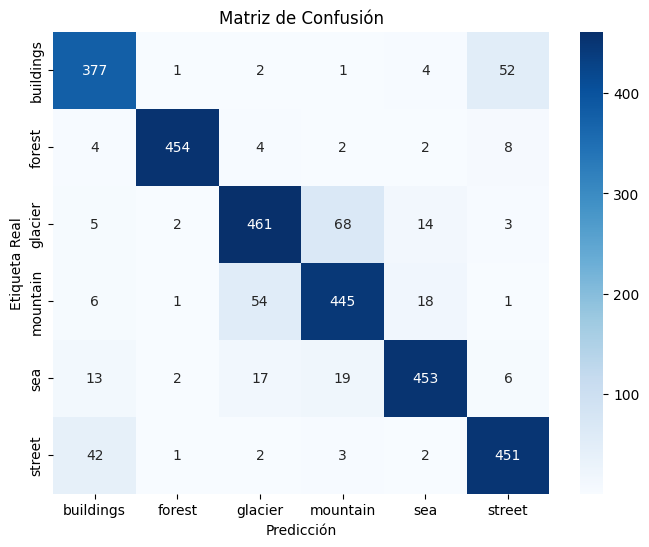

In [ ]:
# Obtener las verdaderas etiquetas y predicciones
X_test, y_test = [], []

# Recorremos val_gen para obtener todos los datos reales
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_test.append(x_batch)
    y_test.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

# Convertimos a arrays
X_test = np.concatenate(X_test)
y_test = np.argmax(np.concatenate(y_test), axis=1)

# Predicciones del modelo
y_pred_probs = resnet_model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=val_gen.class_indices.keys(), yticklabels=val_gen.class_indices.keys())
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta Real")
plt.show()

Al modelo le sigue costando la diferenciación entre montaña y glaciar y calles con edificios, pero redujo bastante la confusión entre glaciar y mar (como teníamos en el modelo anterior).

#### Visualizar ejemplos

94/94 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step


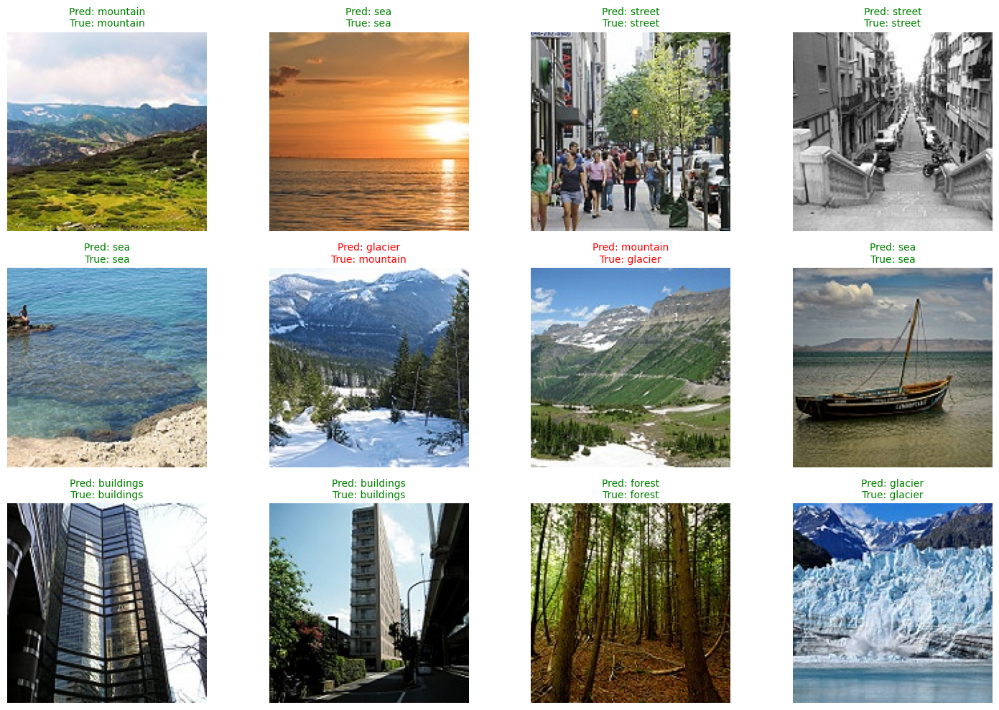

In [ ]:
# Visualización de predicciones acertadas y fallidas
# Obtener los nombres de las clases
class_names = list(val_gen.class_indices.keys())

# Preparar datos reales del generador de validación
X_val, y_val = [], []
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_val.append(x_batch)
    y_val.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

X_val = np.concatenate(X_val)
y_val = np.argmax(np.concatenate(y_val), axis=1)

# Obtener predicciones
y_pred_probs = resnet_model.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)

# Función para visualizar
def plot_predictions(X, y_true, y_pred, class_names, num_images=12):
    plt.figure(figsize=(15, 10))
    indices = np.random.choice(len(X), size=num_images, replace=False)

    for i, idx in enumerate(indices):
        plt.subplot(3, 4, i+1)
        plt.imshow(X[idx])
        plt.axis('off')

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        correct = y_true[idx] == y_pred[idx]

        color = 'green' if correct else 'red'
        plt.title(f'Pred: {pred_label}\nTrue: {true_label}', color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones
plot_predictions(X_val, y_val, y_pred, class_names, num_images=12)

-------------

#### **Conclusión parcial**
Se nota una predicción excelente del modelo, mejorando un poco más con respecto a CNN. Las únicas dos fotos que tienen malas predicciones del muestreo chico hecho arriba, son de una foto que es de por sí 'ambigua' (es una montaña con bastante nieve y la confundió con glaciar) y otra, más interesante, es una foto que se ve está mal etiquetada y de hecho la predicción del modelo fue la clasificación correcta. Todo esto es congruente con lo subrayado en la matriz de confusión, y vemos que nuestros modelos están llegando a un tope con las métricas por la cantidad de fotos dudosas. La curva de validation siguen con picos y saltos feos

## **Modelo 4: Transfer Learning usando MobileNet como backbone**

Como las imágenes son chicas de 150x150, decidimos usar a MobileNet como backbone. Investigamos y descubrimos que funciona bien en teoría con imágenes de paisajes, además de que entrena rápido y sin necesidad de mucha memoria. Queremos contrastar esto con los anteriores modelos en los que el entrenamiento fue lento, y observar y comparar qué resultados podemos conseguir.

###Función para construir el modelo

In [ ]:
def build_model(input_shape, num_classes, learning_rate=0.001):
    backbone_model = MobileNetV2(
        input_shape=input_shape,
        include_top=False,
        weights='imagenet'
    )

    backbone_model.trainable = False

    # Construcción del modelo completo
    x = backbone_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=backbone_model.input, outputs=outputs)

    # Compilar
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
#Creamos el modelo
mobileNet_model = build_model(
    input_shape=(150, 150, 3),
    num_classes=train_gen.num_classes
    )

# Vemos su estructura
mobileNet_model.summary()

<ipython-input-69-7da1a1acd0c9>:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone_model = MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_11[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,265,670 (8.64 MB)

 Trainable params: 7,686 (30.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

###Entrenamiento

In [ ]:
#Comenzamos con pocas épocas para ver el comportamiento inicial
EPOCHS = 25

history = mobileNet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping]
)

Epoch 1/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - accuracy: 0.7462 - loss: 0.6983 - val_accuracy: 0.8883 - val_loss: 0.2941
Epoch 2/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.8941 - loss: 0.3068 - val_accuracy: 0.8913 - val_loss: 0.2745
Epoch 3/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.8969 - loss: 0.2835 - val_accuracy: 0.8920 - val_loss: 0.2750
Epoch 4/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.9050 - loss: 0.2587 - val_accuracy: 0.8953 - val_loss: 0.2778
Epoch 5/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.9080 - loss: 0.2535 - val_accuracy: 0.9017 - val_loss: 0.2688
Epoch 6/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.9066 - loss: 0.2546 - val_accuracy: 0.9030 - val_loss: 0.2715
Epoch 7/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.9083 - loss: 0.2448 - val_accuracy: 0.8870 - val_loss: 0.3109
Epoch 8/25
439/439 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step - accuracy: 0.9057 - loss: 0.2508 - 

In [ ]:
#Guardamos el modelo ya entrenado y su history
save_model_and_history(mobileNet_model, history, 'mobileNet_model')

Modelo guardado como mobileNet_model.keras
Historial guardado como mobileNet_model_history.pkl


In [ ]:
mobileNet_model, history_mobileNet = load_model_and_history('mobileNet_model')

Modelo cargado desde mobileNet_model.keras
Historial cargado desde mobileNet_model_history.pkl


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


### Evaluación del modelo

#### Visualización accuracy y loss

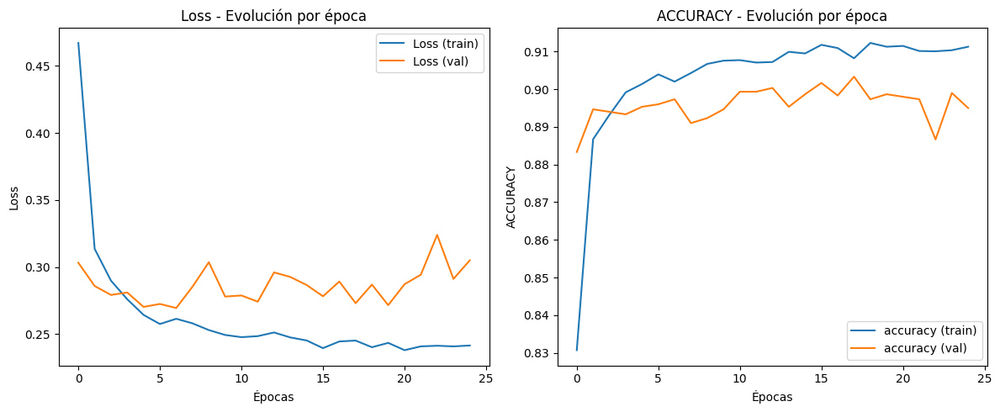

In [ ]:
plot_training(history_mobileNet, metric='accuracy')

En la gráfica de Loss, se nota por la curva de train que el modelo aprende rápidamente al principio (0-5 épocas) y continúa haciéndolo en cada época que pasa. Mientras que con los datos de validación, si bien baja en las primeras épocas, lo cual es muy bueno, después llega a un mínimo y comienza a oscilar (cerca de la época 5). La curva no baja más después del mínimo, y de hecho, hacia el final, tiende a subir ligeramente (épocas 20-24). Y como dijimos que con los datos de train en realidad el modelo sigue aprendiendo en cada época, entonces parece empezar a sobreajustar (overfitting): el loss(val) empieza a empeorar, mientras el loss(train) sigue mejorando.

En la gráfica de Accuracy, se nota que en los datos de train sube rápidamente (de 83% a más de 90% en pocas épocas), luego sigue subiendo muy suave y llega a estabilizarse cerca del 91%. El modelo se ajusta bien a los datos de entrenamiento. Mientras que con los datos de validación, se nota la misma tendencia de que accuracy sube rápido al principio y luego se aplasta, llegando a oscilar alrededor de 89-90%. La pequeña caída que presenta la curva al final, es consistente con el overfitting que se empezó a ver en la curva de loss.

Con todo esto notamos que el modelo ajusta bastante bien, que no es necesario hacer más épocas pero que sí podríamos ser más severos en cuanto a la regularización, para mejorar la cuestión del leve overfitting.

####Matriz de confusión

94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 617ms/step


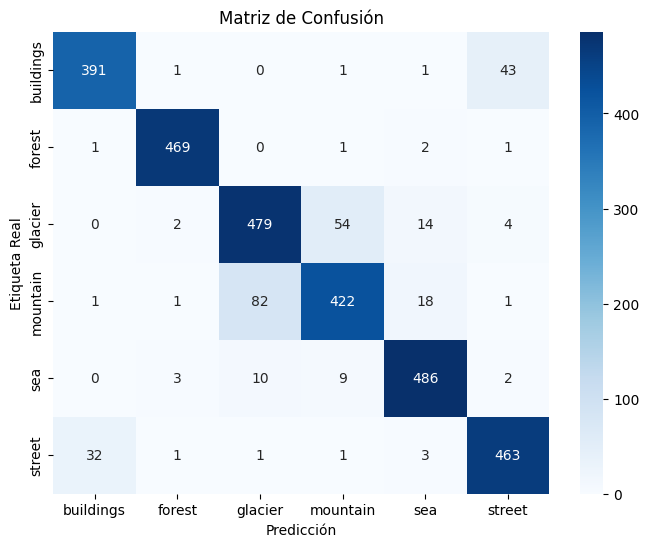

In [ ]:
# Obtener las verdaderas etiquetas y predicciones
X_test, y_test = [], []

# Recorremos val_gen para obtener todos los datos reales
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_test.append(x_batch)
    y_test.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

# Convertimos a arrays
X_test = np.concatenate(X_test)
y_test = np.argmax(np.concatenate(y_test), axis=1)

# Predicciones del modelo
y_pred_probs = mobileNet_model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=val_gen.class_indices.keys(), yticklabels=val_gen.class_indices.keys())
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta Real")
plt.show()


Tampoco este modelo parece poder resolver mejor la diferenciación entre las calles con los edificios, y las montañas con los glaciares. Parece que llegamos a un tope de mejora

####Evaluación métricas

In [ ]:
train_gen_eval, val_gen_eval = crear_generadores_evaluacion_acc()

mobileNet_train_loss, mobileNet_train_acc = mobileNet_model.evaluate(train_gen_eval, verbose=0)
mobileNet_val_loss, mobileNet_val_acc = mobileNet_model.evaluate(val_gen_eval, verbose=0)

round(mobileNet_train_acc,3), round(mobileNet_val_acc,3)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


(0.941, 0.903)

Mayor valor obtenido en datos de validación, y se redujo diferencia entre train y test a comparación del modelo anterior

####Visualización de ejemplos de predicciones

94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 624ms/step


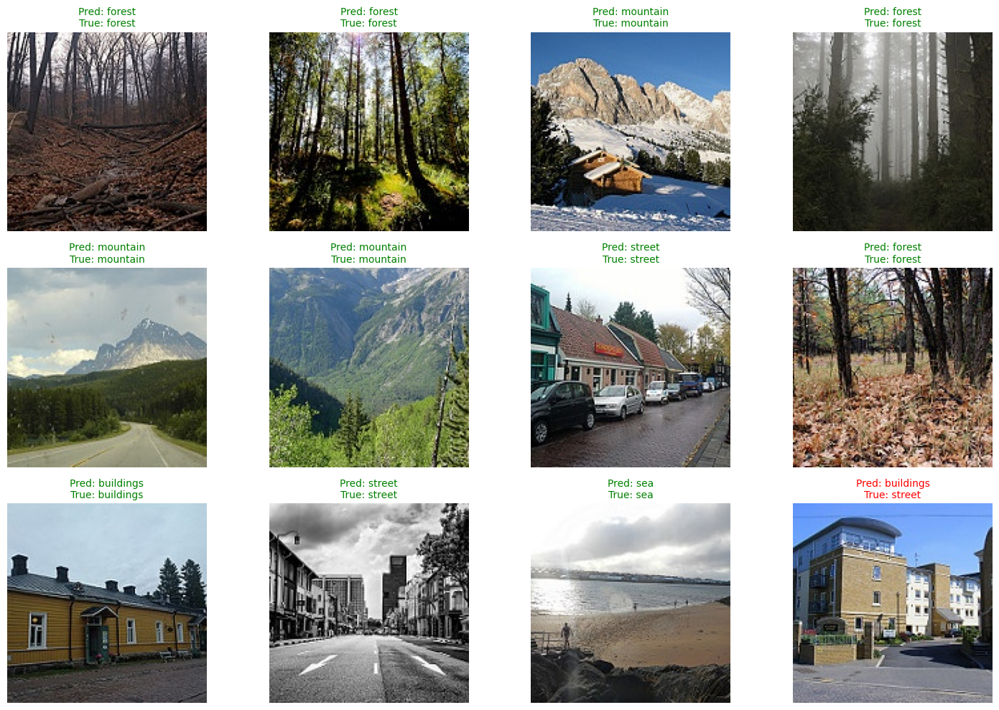

In [ ]:
# Visualización de predicciones acertadas y fallidas
# Obtener los nombres de las clases
class_names = list(val_gen.class_indices.keys())

# Preparar datos reales del generador de validación
X_val, y_val = [], []
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    X_val.append(x_batch)
    y_val.append(y_batch)
    if (i + 1) * val_gen.batch_size >= val_gen.samples:
        break

X_val = np.concatenate(X_val)
y_val = np.argmax(np.concatenate(y_val), axis=1)

# Obtener predicciones
y_pred_probs = mobileNet_model.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)

# Función para visualizar
def plot_predictions(X, y_true, y_pred, class_names, num_images=12):
    plt.figure(figsize=(15, 10))
    indices = np.random.choice(len(X), size=num_images, replace=False)

    for i, idx in enumerate(indices):
        plt.subplot(3, 4, i+1)
        plt.imshow(X[idx])
        plt.axis('off')

        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        correct = y_true[idx] == y_pred[idx]

        color = 'green' if correct else 'red'
        plt.title(f'Pred: {pred_label}\nTrue: {true_label}', color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

# Mostrar algunas predicciones
plot_predictions(X_val, y_val, y_pred, class_names, num_images=12)

-------------

####**Conclusiones parciales**
Este fue el mejor modelo, y se redujo mucho la inestabilidad que veníamos notando en las curvas de validación. Parece que ya llegamos a un tope de mejoría debido a las fotos ambiguas del dataset y las otras que están mal etiquetadas

## **Comparación de Modelos y Conclusiones Generales**

In [ ]:
#Construimos tabla con todos los modelos vistos y columnas de Accuracy Train y Accuracy Validation obtenidas en cada uno
modelos = ['Red Neuronal con Capas Densas', 'CNN Simple', 'Red Convolucional c/Bloques Residuales','TL con MobileNet']
acc_train = [nn_train_acc, cnn_train_acc, resnet_train_acc, mobileNet_train_acc]
acc_val = [nn_val_acc, cnn_val_acc, resnet_val_acc, mobileNet_val_acc]
comparacion_modelos = pd.DataFrame()
comparacion_modelos['Modelo'] = modelos
comparacion_modelos['Accuracy Train'] = [round(x, 3) for x in acc_train]
comparacion_modelos['Accuracy Validation'] = [round(x, 3) for x in acc_val]

comparacion_modelos

,Modelo,Accuracy Train,Accuracy Validation
0,Red Neuronal con Capas Densas,0.770,0.585
1,CNN Simple,0.856,0.849
2,Red Convolucional c/Bloques Residuales,0.974,0.880
3,TL con MobileNet,0.941,0.903


In [ ]:
comparacion_parametros_modelos = pd.DataFrame()
comparacion_parametros_modelos['Modelo'] = modelos
comparacion_parametros_modelos['Cantidad de Parámetros (Millones)'] = ['1.5', '5.4', '2.8', '2.6']

comparacion_parametros_modelos

,Modelo,Cantidad de Parámetros (Millones)
0,Red Neuronal con Capas Densas,1.5
1,CNN Simple,5.4
2,Red Convolucional c/Bloques Residuales,2.8
3,TL con MobileNet,2.6



Se compararon las cuatro arquitecturas distintas. MobileNet obtuvo la mejor accuracy en validación (0.903), seguida por la red con bloques residuales (0.880). Ambas muestran buen desempeño y generalización. Las otras redes tuvieron menor rendimiento, lo que nos dice que arquitecturas más profundas o preentrenadas captan mejor los patrones del conjunto de datos para este tipo de problemas, y que definitivamente las redes densas sin capas convolucionales no son las adecuadas. Estas performances nos satisfacen, sabíamos que el modelo de TL iba a ser el mejor por estar entrenado con millones de fotos, e iba a poder con la clasificación de paisajes. Que haya tenido un accuracy de sólo 2% más alto que el del modelo con bloques residuales en vez de ser bastante mejor y acercarse a 1, lo adjudicamos a la presencia de las fotos mal etiquetadas que pudimos detectar que hay, en conjunto con la cantidad de fotos que son tan parecidas entre sí que su clasificación se hace inevitablemente bastante dudosa, como vimos en la matriz de confusión. Entendemos que llegamos a un tope de mejoría. Las validaciones hubiesen sido mejores con un dataset más grande, quizás podríamos haberlo mergeado con el dataset de predicción para controlar mejor esto.  
Por otra parte, sabemos que cuantos más parámetros, mayor capacidad de aprender patrones complejos, pero también mayor riesgo de overfitting y más demanda computacional. No creemos que valga la pena entrenar un modelo como el de CNN que hicimos porque tomó muchísimo más tiempo que los demás, y aún con tantos parámetros su rendimiento no fue tan eficiente como uno más liviano como el de TL o la resnet, que lograron resultados mejores siendo más chicos. Entre los archivos generados al guardar los modelos, el preentrenado también es el de menor tamaño en MB. Todo esto destaca la eficiencia y capacidad de generalización de los modelos preentrenados.

Para terminar esta conclusión y a modo de cierre del trabajo, vamos a utilizar el dataset de predicción con el mejor modelo que obtuvimos para clasificar esas fotos sin labels.

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


229/229 ━━━━━━━━━━━━━━━━━━━━ 139s 599ms/step


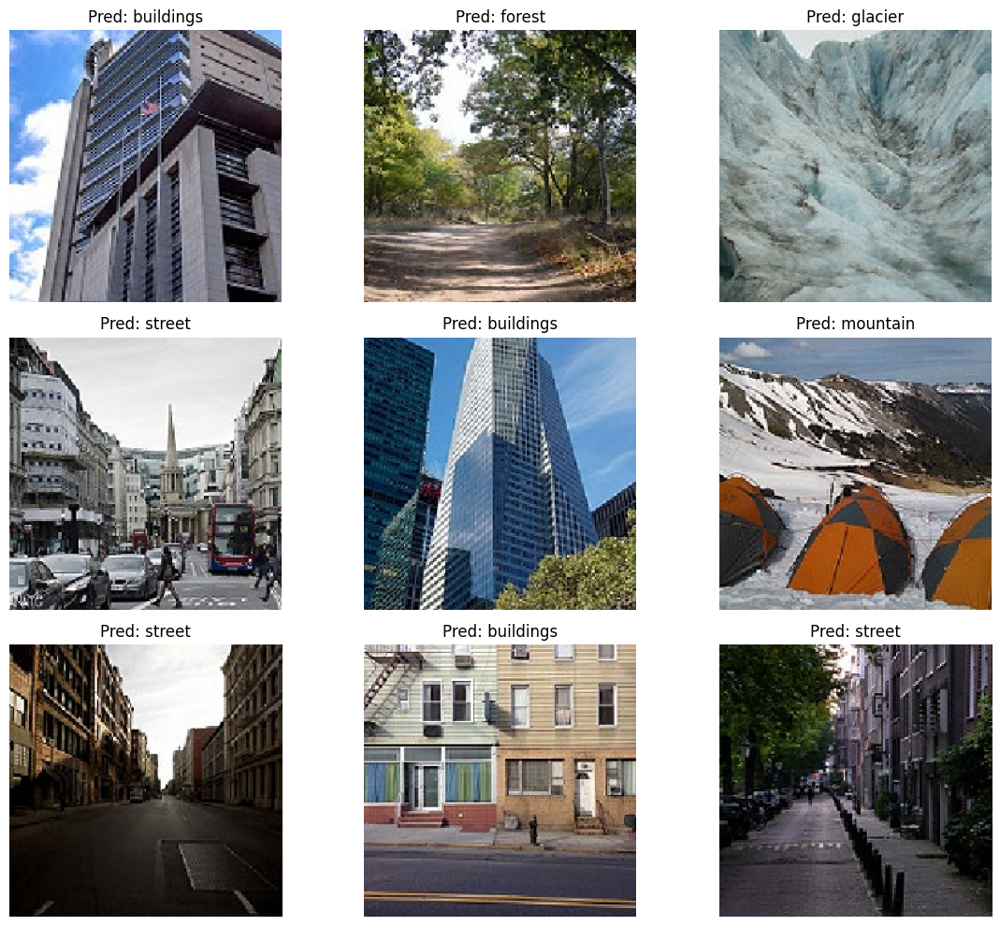

In [ ]:
#Predecir clases
pred_gen.reset()  #Asegura que empieza desde el principio
predictions = mobileNet_model.predict(pred_gen, verbose=1)

# Obtener las clases predichas como índice
predicted_class_indices = np.argmax(predictions, axis=1)

# Obtener los nombres de las clases
labels = (train_gen.class_indices)
labels = dict((v, k) for k, v in labels.items())  # invertir el diccionario
predicted_labels = [labels[k] for k in predicted_class_indices]
filenames = pred_gen.filenames

# Mostrar algunas imágenes con su predicción
plt.figure(figsize=(12, 10))
for i in range(9):
    idx = random.randint(0, len(filenames) - 1)
    img_path = pred_gen.directory + '/' + filenames[idx]
    img = image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Pred: {predicted_labels[idx]}")
plt.tight_layout()
plt.show()

Dejamos disponible en nuestro drive una carpeta final en donde estarán la totalidad de las imágenes del dataset de predicciones, ahora clasificadas.

In [ ]:
# Ruta base donde están las imágenes originales
source_dir = pred_gen.directory
# Nueva carpeta para guardar todo clasificado
output_dir = "predicciones_clasificadas"

# Crear carpeta de salida
os.makedirs(output_dir, exist_ok=True)

for i in range(len(filenames)):
    pred_label = predicted_labels[i]
    src_path = os.path.join(source_dir, filenames[i])

    # Crear carpeta por clase
    class_dir = os.path.join(output_dir, pred_label)
    os.makedirs(class_dir, exist_ok=True)

    # Copiar imagen a la carpeta correspondiente
    filename_only = os.path.basename(filenames[i])
    dst_path = os.path.join(class_dir, filename_only)

    shutil.copy(src_path, dst_path)

print(f"Imágenes copiadas a '{output_dir}/[clase]/'.")

Imágenes copiadas a 'predicciones_clasificadas/[clase]/'.


In [ ]:
# Comprimir la carpeta en un ZIP
shutil.make_archive("predicciones_clasificadas", 'zip', "predicciones_clasificadas")

'/content/predicciones_clasificadas.zip'